<h1>Final Project - MDdDM</h1>
<h3>As the final project, we must create a segmentation aiming to target insurances customers based on the K-Means clustering method</h3>


<h3>Project Description</h3>
As a Data Mining/Analytic Consultant, you are asked develop a Customer Segmentation in such a way that it will be possible for the Marketing Department to better understand all the different Customers’ Profiles.

You are expected to define, describe and explain the clusters you chose. Invest time in reasoning how you want to do your clustering, possible approaches, and advantages or disadvantages of different decisions. Simultaneous, you should express the marketing approach you recommend for each cluster. 

In [225]:
import pandas as pd
import numpy  as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
import sys
np.set_printoptions(threshold=sys.maxsize)
np.set_printoptions(suppress=True)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: '%.5f' % x)

<h2>Business Understanding</h2>

# TBD

<h2>Data Import and Understanding</h2>

<p>To import the data, we will simply use the function .read_sas from <b>Pandas<b> and call our DataFrame <b>"df"<b>.<p>
<p>Later, we will use some descriptive methods to understand our DataFrame and be prepare to work on it<p>
<h4>Descrtiptive Methods:<h4>
<ul>
<il>.info()<il>
<il>.unique()<il>
<il>.describe()<il>
<il>.isnull()<il>
<ul>



In [226]:
df = pd.read_sas('a2z_insurance.sas7bdat')

df.shape
df.info()
df.head()

(10296, 14)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10296 non-null  float64
 1   FirstPolYear   10266 non-null  float64
 2   BirthYear      10279 non-null  float64
 3   EducDeg        10279 non-null  object 
 4   MonthSal       10260 non-null  float64
 5   GeoLivArea     10295 non-null  float64
 6   Children       10275 non-null  float64
 7   CustMonVal     10296 non-null  float64
 8   ClaimsRate     10296 non-null  float64
 9   PremMotor      10262 non-null  float64
 10  PremHousehold  10296 non-null  float64
 11  PremHealth     10253 non-null  float64
 12  PremLife       10192 non-null  float64
 13  PremWork       10210 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.00000,1985.00000,1982.00000,b'2 - High School',2177.00000,1.00000,1.00000,380.97000,0.39000,375.85000,79.45000,146.36000,47.01000,16.89000
1,2.00000,1981.00000,1995.00000,b'2 - High School',677.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000
2,3.00000,1991.00000,1970.00000,b'1 - Basic',2277.00000,3.00000,0.00000,504.67000,0.28000,206.15000,224.50000,124.58000,86.35000,99.02000
3,4.00000,1990.00000,1981.00000,b'3 - BSc/MSc',1099.00000,4.00000,1.00000,-16.99000,0.99000,182.48000,43.35000,311.17000,35.34000,28.34000
4,5.00000,1986.00000,1973.00000,b'3 - BSc/MSc',1763.00000,4.00000,1.00000,35.23000,0.90000,338.62000,47.80000,182.59000,18.78000,41.45000


In [227]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,10296.00000,NaN,NaN,NaN,5148.50000,2972.34352,1.00000,2574.75000,5148.50000,7722.25000,10296.00000
FirstPolYear,10266.00000,NaN,NaN,NaN,1991.06263,511.26791,1974.00000,1980.00000,1986.00000,1992.00000,53784.00000
BirthYear,10279.00000,NaN,NaN,NaN,1968.00778,19.70948,1028.00000,1953.00000,1968.00000,1983.00000,2001.00000
EducDeg,10279,4,b'3 - BSc/MSc',4799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10260.00000,NaN,NaN,NaN,2506.66706,1157.44963,333.00000,1706.00000,2501.50000,3290.25000,55215.00000
GeoLivArea,10295.00000,NaN,NaN,NaN,2.70986,1.26629,1.00000,1.00000,3.00000,4.00000,4.00000
Children,10275.00000,NaN,NaN,NaN,0.70676,0.45527,0.00000,0.00000,1.00000,1.00000,1.00000
CustMonVal,10296.00000,NaN,NaN,NaN,177.89260,1945.81151,-165680.42000,-9.44000,186.87000,399.77750,11875.89000
ClaimsRate,10296.00000,NaN,NaN,NaN,0.74277,2.91696,0.00000,0.39000,0.72000,0.98000,256.20000
PremMotor,10262.00000,NaN,NaN,NaN,300.47025,211.91500,-4.11000,190.59000,298.61000,408.30000,11604.42000


In [228]:
#Setting Customer ID as the Index of the DataFrame

df.set_index('CustID', inplace=True)

<h2>Columns Dropping and Creation</h2>

In [229]:
df['Age'] = 2016 - df.BirthYear
df['YearsOfCustomer'] = 2016 - df.FirstPolYear
df.drop(['FirstPolYear', 'BirthYear'], axis=1, inplace=True)

df.head()

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,YearsOfCustomer
CustID,,,,,,,,,,,,,
1.00000,b'2 - High School',2177.00000,1.00000,1.00000,380.97000,0.39000,375.85000,79.45000,146.36000,47.01000,16.89000,34.00000,31.00000
2.00000,b'2 - High School',677.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000,21.00000,35.00000
3.00000,b'1 - Basic',2277.00000,3.00000,0.00000,504.67000,0.28000,206.15000,224.50000,124.58000,86.35000,99.02000,46.00000,25.00000
4.00000,b'3 - BSc/MSc',1099.00000,4.00000,1.00000,-16.99000,0.99000,182.48000,43.35000,311.17000,35.34000,28.34000,35.00000,26.00000
5.00000,b'3 - BSc/MSc',1763.00000,4.00000,1.00000,35.23000,0.90000,338.62000,47.80000,182.59000,18.78000,41.45000,43.00000,30.00000


<h2>Finding and Dealing with Outliers</h2>

Before removing NaN values, we will deal with the Outliers in order to be able to use the data base mean later without overestimating the values.

Source: https://towardsdatascience.com/ways-to-detect-and-remove-the-outliers-404d16608dba

<Figure size 1440x720 with 0 Axes>

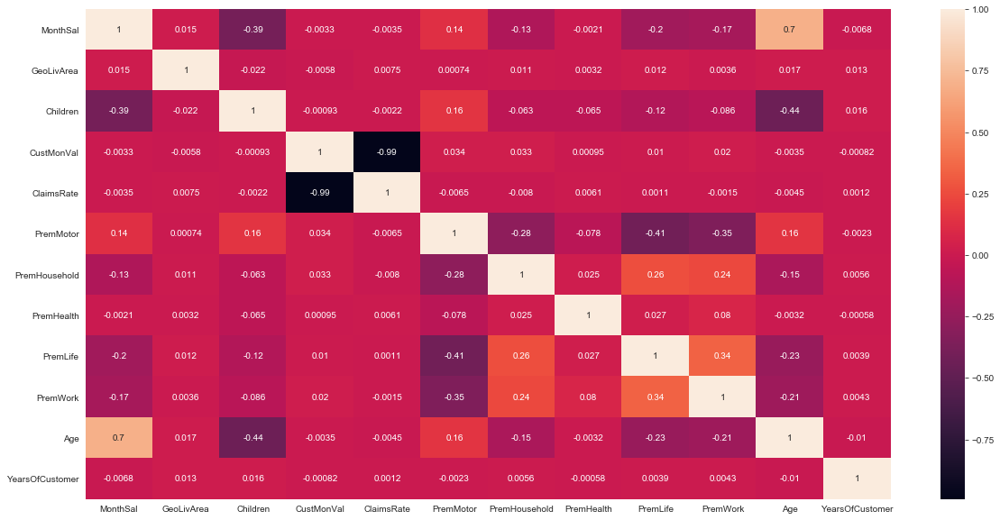

In [230]:
plt.figure(figsize=(20, 10))

heatmap = sns.heatmap(df.corr(), annot=True)

<h3>We find a strong correlation from CustMonVal and ClaimsRate</h3>

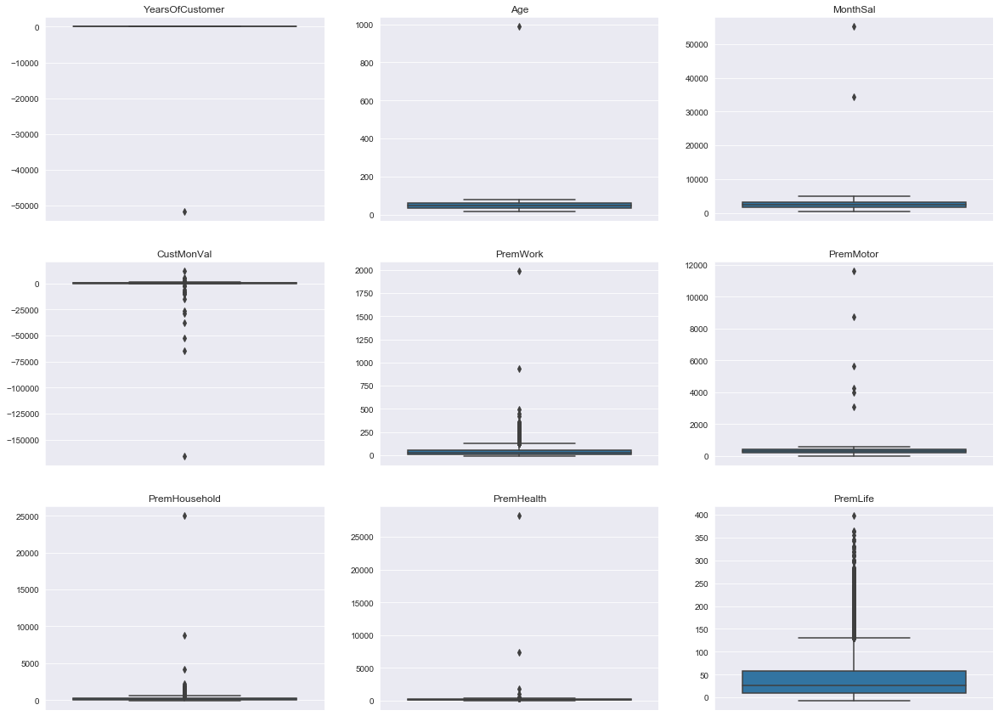

In [231]:
# vars com outliers
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,15))

sns.boxplot(data=df, y='YearsOfCustomer', ax=axes[0][0]).set(ylabel=None);
sns.boxplot(data=df, y='Age', ax=axes[0][1]).set(ylabel=None);
sns.boxplot(data=df, y='MonthSal', ax=axes[0][2]).set(ylabel=None);
sns.boxplot(data=df, y='CustMonVal', ax=axes[1][0]).set(ylabel=None);
sns.boxplot(data=df, y='PremWork', ax=axes[1][1]).set(ylabel=None);
sns.boxplot(data=df, y='PremMotor', ax=axes[1][2]).set(ylabel=None);
sns.boxplot(data=df, y='PremHousehold', ax=axes[2][0]).set(ylabel=None);
sns.boxplot(data=df, y='PremHealth', ax=axes[2][1]).set(ylabel=None);
sns.boxplot(data=df, y='PremLife', ax=axes[2][2]).set(ylabel=None);

axes[0][0].set(title='YearsOfCustomer');
axes[0][1].set(title='Age');
axes[0][2].set(title='MonthSal');
axes[1][0].set(title='CustMonVal');
axes[1][1].set(title='PremWork');
axes[1][2].set(title='PremMotor');
axes[2][0].set(title='PremHousehold');
axes[2][1].set(title='PremHealth');
axes[2][2].set(title='PremLife');

plt.show();

Based on the visualizations above, we decided to do the following cleaning in order to delete the outliers from our table.

<ul>
<li><b>Age</b> > 200</li>
<li><b>YearsOfCustomer</b> < -100 </li>
<li><b>PremWork</b> > 750 </li>
<li><b>PremMotor</b> > 8.000 </li>
<li><b>PremHousehold</b> > 5.000 </li>
<li><b>PremHealth</b> > 5.000 </li>
<li><b>CustMonVal</b> > -10.000 </li>
</ul>

This will remove the wrong filling values in <b>BirthYear</b> and <b>FirstPolYear</b>. Altough we believe that the <b>MonthSal</b> numbers might not be miss filled, we opted to remove this outliers in order for the model to work best.

In [232]:
#Creating df_clean with the instructions above and showing its side compared to the original df
df_clean = df[(df['Age'] < 200) & (df['YearsOfCustomer'] > -100) & (df['PremWork'] < 750) & (df['PremMotor'] < 8000) & (df['PremHousehold'] < 5000) & (df['PremHealth'] < 5000)&  (df['CustMonVal'] > -10000)]

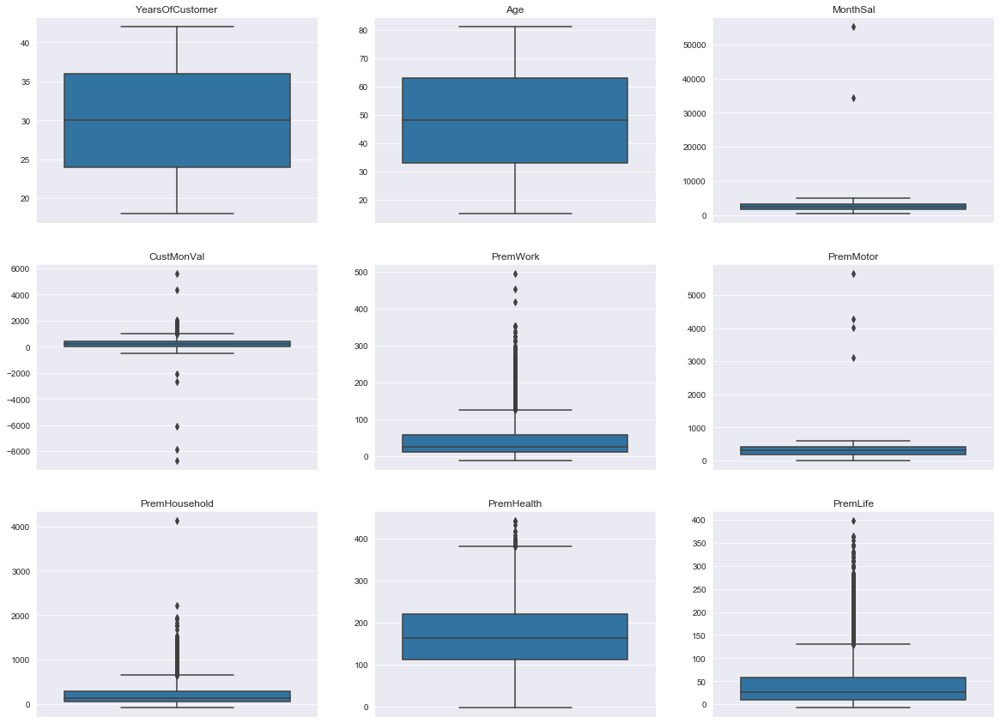

In [233]:
# vars com outliers
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,15))

sns.boxplot(data=df_clean, y='YearsOfCustomer', ax=axes[0][0]).set(ylabel=None);
sns.boxplot(data=df_clean, y='Age', ax=axes[0][1]).set(ylabel=None);
sns.boxplot(data=df_clean, y='MonthSal', ax=axes[0][2]).set(ylabel=None);
sns.boxplot(data=df_clean, y='CustMonVal', ax=axes[1][0]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremWork', ax=axes[1][1]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremMotor', ax=axes[1][2]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremHousehold', ax=axes[2][0]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremHealth', ax=axes[2][1]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremLife', ax=axes[2][2]).set(ylabel=None);

axes[0][0].set(title='YearsOfCustomer');
axes[0][1].set(title='Age');
axes[0][2].set(title='MonthSal');
axes[1][0].set(title='CustMonVal');
axes[1][1].set(title='PremWork');
axes[1][2].set(title='PremMotor');
axes[2][0].set(title='PremHousehold');
axes[2][1].set(title='PremHealth');
axes[2][2].set(title='PremLife');

plt.show();

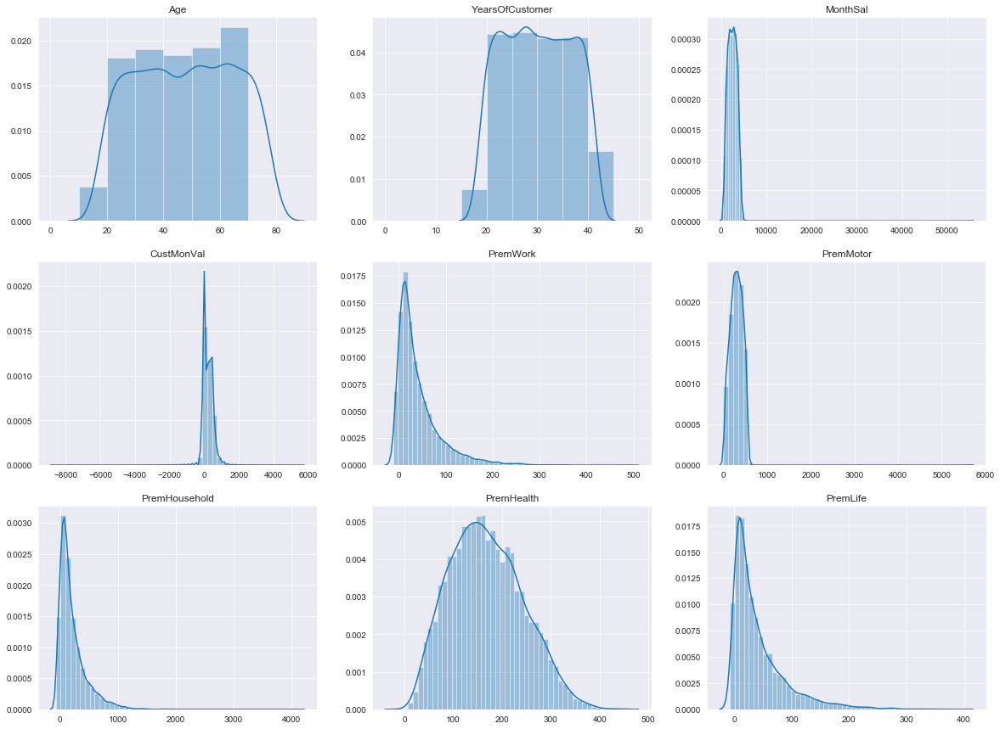

In [234]:
# vars com outliers
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,15))

sns.distplot(df_clean["Age"], bins=[0, 10, 20, 30, 40, 50, 60, 70], ax=axes[0][0]).set(xlabel=None);
sns.distplot(df_clean["YearsOfCustomer"], bins=[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50], ax=axes[0][1]).set(xlabel=None);
#sns.distplot(df["FirstPolYear"], bins=[1960, 1970, 1980, 1990, 2000, 2010], ax=axes[0][0]).set(xlabel=None);
#sns.distplot(df["BirthYear"], bins=[1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990, 2000, 2010], ax=axes[0][1]).set(xlabel=None);
sns.distplot(df_clean["MonthSal"], bins=[0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000], ax=axes[0][2]).set(xlabel=None);
sns.distplot(df_clean["CustMonVal"], ax=axes[1][0]).set(xlabel=None);
sns.distplot(df_clean["PremWork"], ax=axes[1][1]).set(xlabel=None);
sns.distplot(df_clean["PremMotor"], ax=axes[1][2]).set(xlabel=None);
sns.distplot(df_clean["PremHousehold"], ax=axes[2][0]).set(xlabel=None);
sns.distplot(df_clean["PremHealth"], ax=axes[2][1]).set(xlabel=None);
sns.distplot(df_clean["PremLife"], ax=axes[2][2]).set(xlabel=None);


axes[0][0].set(title='Age');
axes[0][1].set(title='YearsOfCustomer');
axes[0][2].set(title='MonthSal');
axes[1][0].set(title='CustMonVal');
axes[1][1].set(title='PremWork');
axes[1][2].set(title='PremMotor');
axes[2][0].set(title='PremHousehold');
axes[2][1].set(title='PremHealth');
axes[2][2].set(title='PremLife');

plt.show();

In [235]:
print(round(df_clean.shape[0] / df.shape[0], 4),'%')
print(df.shape[0] - df_clean.shape[0])

0.9809 %
197


Now that we have dealed with the last sensitive columns from our data, let's look at the <b>"CustMonVal"</b> numbers.

<b>Remember:</b> we don't want to remove all outliers from this column because it could allow our model to later find customers that might be a big source of profit or the opposite.

<h2>Data Exploration</h2>

<h3>Issue 1: Age < YearsOf Customer</h3>

The first issue we found is regarding the amount of people who had insurances for more time that were alived.

<b>There is a total of 1.939 people with Years as a Customer bigger than their ages.</b>

In [236]:
df_clean[df_clean.Age < df_clean.YearsOfCustomer]

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,YearsOfCustomer
CustID,,,,,,,,,,,,,
2.00000,b'2 - High School',677.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000,21.00000,35.00000
14.00000,b'1 - Basic',1043.00000,3.00000,1.00000,-75.12000,1.06000,44.34000,342.85000,127.69000,267.94000,94.46000,16.00000,33.00000
19.00000,b'1 - Basic',1414.00000,3.00000,1.00000,230.38000,0.71000,313.17000,373.40000,121.80000,14.78000,72.57000,34.00000,35.00000
23.00000,b'2 - High School',1495.00000,1.00000,1.00000,-89.79000,1.08000,209.04000,308.95000,192.48000,64.79000,54.90000,30.00000,40.00000
41.00000,b'2 - High School',1177.00000,4.00000,1.00000,121.36000,0.84000,52.01000,455.65000,135.47000,146.36000,148.03000,21.00000,22.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10268.00000,b'1 - Basic',834.00000,4.00000,1.00000,254.72000,0.67000,181.48000,309.50000,134.58000,114.80000,98.24000,20.00000,39.00000
10269.00000,b'3 - BSc/MSc',1414.00000,3.00000,1.00000,50.46000,0.90000,129.58000,167.80000,184.48000,165.92000,75.46000,28.00000,29.00000
10274.00000,b'2 - High School',1035.00000,1.00000,1.00000,293.51000,0.58000,235.71000,195.60000,103.13000,170.92000,58.12000,24.00000,27.00000


<h3>Issue 2: Under 16 with Insurances</h3>

There is 12 clients under 16 that has values for PremHousehold, PremWork and PremMotor, which wouldn't make sense for such audience.

In [237]:
df_U16 = df_clean[(df['Age'] < 16)]
df_U16[['Age', 'MonthSal', 'PremMotor', 'PremHousehold', 'PremWork', 'PremLife', 'PremHealth']]

df_U16.shape

,Age,MonthSal,PremMotor,PremHousehold,PremWork,PremLife,PremHealth
CustID,,,,,,,
660.00000,15.00000,1284.00000,46.23000,1079.65000,-10.00000,252.27000,72.68000
690.00000,15.00000,1180.00000,54.90000,406.20000,256.05000,112.02000,65.79000
866.00000,15.00000,562.00000,40.34000,847.95000,112.13000,178.70000,94.24000
1437.00000,15.00000,823.00000,129.58000,177.80000,218.15000,176.70000,58.01000
2580.00000,15.00000,1006.00000,48.23000,396.75000,24.45000,127.58000,291.50000
3147.00000,15.00000,372.00000,60.68000,270.60000,107.13000,182.48000,177.59000
4466.00000,15.00000,958.00000,28.56000,1359.15000,179.59000,38.23000,68.79000
4484.00000,15.00000,1241.00000,43.34000,589.55000,179.48000,121.80000,142.47000
5348.00000,15.00000,1119.00000,148.14000,628.45000,30.23000,45.12000,221.82000


(12, 13)

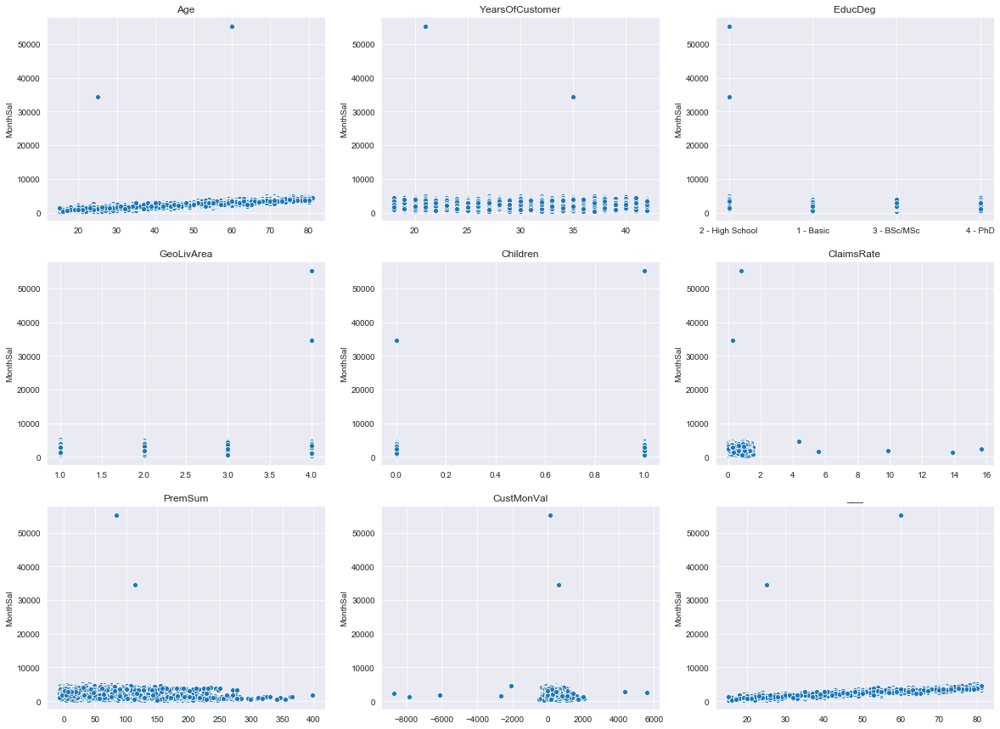

In [238]:
# correlacoes com MonthSal
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,15))

sns.scatterplot(data=df_clean, x="Age", y="MonthSal", ax=axes[0][0]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="YearsOfCustomer", y="MonthSal", ax=axes[0][1]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="EducDeg", y="MonthSal", ax=axes[0][2]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="GeoLivArea", y="MonthSal", ax=axes[1][0]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="Children", y="MonthSal", ax=axes[1][1]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="ClaimsRate", y="MonthSal", ax=axes[1][2]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="PremLife", y="MonthSal", ax=axes[2][0]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="CustMonVal", y="MonthSal", ax=axes[2][1]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="Age", y="MonthSal", ax=axes[2][2]).set(xlabel=None);

axes[0][0].set(title='Age');
axes[0][1].set(title='YearsOfCustomer');
axes[0][2].set(title='EducDeg');
axes[1][0].set(title='GeoLivArea');
axes[1][1].set(title='Children');
axes[1][2].set(title='ClaimsRate');
axes[2][0].set(title='PremSum');
axes[2][1].set(title='CustMonVal');
axes[2][2].set(title='___');

plt.show();

<h2>Dealing with NaN Values</h2>

Support links:

http://towardsdatascience.com/handling-missing-values-with-pandas-b876bf6f008f

https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html


In [239]:
#NaN from the original Data set.
print(df.isna().sum())

EducDeg             17
MonthSal            36
GeoLivArea           1
Children            21
CustMonVal           0
ClaimsRate           0
PremMotor           34
PremHousehold        0
PremHealth          43
PremLife           104
PremWork            86
Age                 17
YearsOfCustomer     30
dtype: int64


In [240]:
print(df_clean.isna().sum())

EducDeg             1
MonthSal           28
GeoLivArea          0
Children           13
CustMonVal          0
ClaimsRate          0
PremMotor           0
PremHousehold       0
PremHealth          0
PremLife           89
PremWork            0
Age                 0
YearsOfCustomer     0
dtype: int64


In [241]:
#As we only have one missing value for the educational column, we will simple replace the missing value with the value from the column before.
df_clean['Children'].fillna(axis=0, method='ffill', inplace=True)

print(df_clean.isna().sum())

EducDeg             1
MonthSal           28
GeoLivArea          0
Children            0
CustMonVal          0
ClaimsRate          0
PremMotor           0
PremHousehold       0
PremHealth          0
PremLife           89
PremWork            0
Age                 0
YearsOfCustomer     0
dtype: int64


In [242]:
df_clean['PremLife'].fillna(df_clean['PremLife'].mean(), inplace=True)

In [243]:
df_clean['EducDeg'].fillna(df_clean['EducDeg'].mode(), inplace=True)

In [244]:
#FillNA MonthSal baseado na idade da pessoa.

#df_clean['MonthSal'].fillna()

In [256]:
print(df_clean.isna().sum())

GeoLivArea                    0
Children                      0
CustMonVal                    0
ClaimsRate                    0
PremMotor                     0
PremHousehold                 0
PremHealth                    0
PremLife                      0
PremWork                      0
YearsOfCustomer               0
AgeBins_<20                   0
AgeBins_20-29                 0
AgeBins_30-39                 0
AgeBins_40-49                 0
AgeBins_50-59                 0
AgeBins_>=60                  0
EducDeg_b'1 - Basic'          0
EducDeg_b'2 - High School'    0
EducDeg_b'3 - BSc/MSc'        0
EducDeg_b'4 - PhD'            0
MonthSalBins_<1100            0
MonthSalBins_1100 - 1500      0
MonthSalBins_1500 - 1900      0
MonthSalBins_1900 - 2300      0
MonthSalBins_2300 - 3200      0
MonthSalBins_>=5000           0
dtype: int64


For the columns <b>"PremMotor"</b>, <b>"PremHousehold"</b>, <b>"PremHealth"</b>, <b>"PremLife"</b>, and <b>"PremWork"</b>, we assumed that the missing values meant that the custmer did not had that product. We then decided to create a colum for each of these products before dealing with these NaN

In [245]:
df_clean.head()

,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,YearsOfCustomer
CustID,,,,,,,,,,,,,
1.00000,b'2 - High School',2177.00000,1.00000,1.00000,380.97000,0.39000,375.85000,79.45000,146.36000,47.01000,16.89000,34.00000,31.00000
2.00000,b'2 - High School',677.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000,21.00000,35.00000
3.00000,b'1 - Basic',2277.00000,3.00000,0.00000,504.67000,0.28000,206.15000,224.50000,124.58000,86.35000,99.02000,46.00000,25.00000
4.00000,b'3 - BSc/MSc',1099.00000,4.00000,1.00000,-16.99000,0.99000,182.48000,43.35000,311.17000,35.34000,28.34000,35.00000,26.00000
5.00000,b'3 - BSc/MSc',1763.00000,4.00000,1.00000,35.23000,0.90000,338.62000,47.80000,182.59000,18.78000,41.45000,43.00000,30.00000


<h2>Creating Dummy Variables for EducDeg</h2>

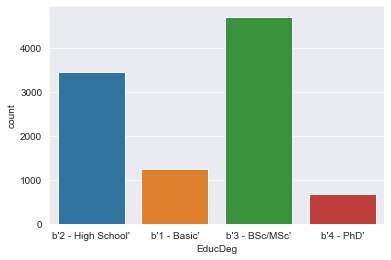

In [246]:
sns.countplot(data=df_clean, x='EducDeg')

In [247]:
df_clean['AgeBins'] = pd.cut(x=df_clean['Age'], bins=[0, 19, 29, 39, 49, 59, 99], labels=['<20','20-29','30-39','40-49','50-59','>=60'])
df_clean['MonthSalBins'] = pd.cut(x=df_clean['MonthSal'], bins=[0, 1100, 1500, 1900, 2300, 3200, 5000], labels=['<1100','1100 - 1500','1500 - 1900','1900 - 2300','2300 - 3200','>=5000'])
df_clean = pd.get_dummies(df_clean, columns=['AgeBins'])
df_clean = pd.get_dummies(df_clean, columns=['EducDeg'])
df_clean = pd.get_dummies(df_clean, columns=['MonthSalBins'])

df_clean.head()

,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,...,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',MonthSalBins_<1100,MonthSalBins_1100 - 1500,MonthSalBins_1500 - 1900,MonthSalBins_1900 - 2300,MonthSalBins_2300 - 3200,MonthSalBins_>=5000
CustID,,,,,,,,,,,,,,,,,,,,,
1.00000,2177.00000,1.00000,1.00000,380.97000,0.39000,375.85000,79.45000,146.36000,47.01000,16.89000,...,0,1,0,0,0,0,0,1,0,0
2.00000,677.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000,...,0,1,0,0,1,0,0,0,0,0
3.00000,2277.00000,3.00000,0.00000,504.67000,0.28000,206.15000,224.50000,124.58000,86.35000,99.02000,...,1,0,0,0,0,0,0,1,0,0
4.00000,1099.00000,4.00000,1.00000,-16.99000,0.99000,182.48000,43.35000,311.17000,35.34000,28.34000,...,0,0,1,0,1,0,0,0,0,0
5.00000,1763.00000,4.00000,1.00000,35.23000,0.90000,338.62000,47.80000,182.59000,18.78000,41.45000,...,0,0,1,0,0,0,1,0,0,0


In [248]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10099 entries, 1.0 to 10296.0
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   MonthSal                    10071 non-null  float64
 1   GeoLivArea                  10099 non-null  float64
 2   Children                    10099 non-null  float64
 3   CustMonVal                  10099 non-null  float64
 4   ClaimsRate                  10099 non-null  float64
 5   PremMotor                   10099 non-null  float64
 6   PremHousehold               10099 non-null  float64
 7   PremHealth                  10099 non-null  float64
 8   PremLife                    10099 non-null  float64
 9   PremWork                    10099 non-null  float64
 10  Age                         10099 non-null  float64
 11  YearsOfCustomer             10099 non-null  float64
 12  AgeBins_<20                 10099 non-null  uint8  
 13  AgeBins_20-29            

In [249]:
cols = ['Age', 'MonthSal']
df_clean.drop(columns=cols, inplace=True)

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10099 entries, 1.0 to 10296.0
Data columns (total 26 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   GeoLivArea                  10099 non-null  float64
 1   Children                    10099 non-null  float64
 2   CustMonVal                  10099 non-null  float64
 3   ClaimsRate                  10099 non-null  float64
 4   PremMotor                   10099 non-null  float64
 5   PremHousehold               10099 non-null  float64
 6   PremHealth                  10099 non-null  float64
 7   PremLife                    10099 non-null  float64
 8   PremWork                    10099 non-null  float64
 9   YearsOfCustomer             10099 non-null  float64
 10  AgeBins_<20                 10099 non-null  uint8  
 11  AgeBins_20-29               10099 non-null  uint8  
 12  AgeBins_30-39               10099 non-null  uint8  
 13  AgeBins_40-49            

In [250]:
df_clean.isna().sum()

GeoLivArea                    0
Children                      0
CustMonVal                    0
ClaimsRate                    0
PremMotor                     0
PremHousehold                 0
PremHealth                    0
PremLife                      0
PremWork                      0
YearsOfCustomer               0
AgeBins_<20                   0
AgeBins_20-29                 0
AgeBins_30-39                 0
AgeBins_40-49                 0
AgeBins_50-59                 0
AgeBins_>=60                  0
EducDeg_b'1 - Basic'          0
EducDeg_b'2 - High School'    0
EducDeg_b'3 - BSc/MSc'        0
EducDeg_b'4 - PhD'            0
MonthSalBins_<1100            0
MonthSalBins_1100 - 1500      0
MonthSalBins_1500 - 1900      0
MonthSalBins_1900 - 2300      0
MonthSalBins_2300 - 3200      0
MonthSalBins_>=5000           0
dtype: int64

In [251]:
df_clean.isna().sum()

GeoLivArea                    0
Children                      0
CustMonVal                    0
ClaimsRate                    0
PremMotor                     0
PremHousehold                 0
PremHealth                    0
PremLife                      0
PremWork                      0
YearsOfCustomer               0
AgeBins_<20                   0
AgeBins_20-29                 0
AgeBins_30-39                 0
AgeBins_40-49                 0
AgeBins_50-59                 0
AgeBins_>=60                  0
EducDeg_b'1 - Basic'          0
EducDeg_b'2 - High School'    0
EducDeg_b'3 - BSc/MSc'        0
EducDeg_b'4 - PhD'            0
MonthSalBins_<1100            0
MonthSalBins_1100 - 1500      0
MonthSalBins_1500 - 1900      0
MonthSalBins_1900 - 2300      0
MonthSalBins_2300 - 3200      0
MonthSalBins_>=5000           0
dtype: int64

<h2>Data Normalization</h2>

https://towardsdatascience.com/data-normalization-with-pandas-and-scikit-learn-7c1cc6ed6475

In [252]:
import collections
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [253]:
# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
df_norm = pd.DataFrame(scaler.fit_transform(df_clean), columns=df_clean.columns)

df_norm

,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,YearsOfCustomer,...,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',MonthSalBins_<1100,MonthSalBins_1100 - 1500,MonthSalBins_1500 - 1900,MonthSalBins_1900 - 2300,MonthSalBins_2300 - 3200,MonthSalBins_>=5000
0,0.00000,1.00000,0.63566,0.02492,0.06725,0.03672,0.33366,0.13326,0.05708,0.54167,...,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000
1,1.00000,1.00000,0.59989,0.07157,0.01444,0.11679,0.26698,0.49711,0.23341,0.70833,...,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,0.66667,0.00000,0.64430,0.01789,0.03722,0.07121,0.28472,0.23032,0.21936,0.29167,...,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000
3,1.00000,1.00000,0.60786,0.06326,0.03303,0.02814,0.70405,0.10447,0.07971,0.33333,...,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000
4,1.00000,1.00000,0.61151,0.05751,0.06066,0.02920,0.41508,0.06361,0.10561,0.50000,...,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10094,0.33333,0.00000,0.60904,0.06134,0.07042,0.02959,0.39535,0.04140,0.05291,0.58333,...,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000
10095,0.66667,0.00000,0.70723,0.00000,0.02437,0.26411,0.32667,0.04907,0.23144,0.87500,...,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000
10096,0.00000,1.00000,0.64566,0.01342,0.07217,0.04941,0.32443,0.04853,0.03337,0.16667,...,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000
10097,0.33333,1.00000,0.62651,0.04153,0.03411,0.06804,0.45055,0.17493,0.24681,0.70833,...,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000


<h1>Modeling</h1>

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=1, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=11, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=12, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=13, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=14, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=16, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=17, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=18, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=19, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

Text(0.5, 1.0, 'Elbow Method')

Text(0.5, 0, 'Number of clusters')

Text(0, 0.5, 'WCSS')

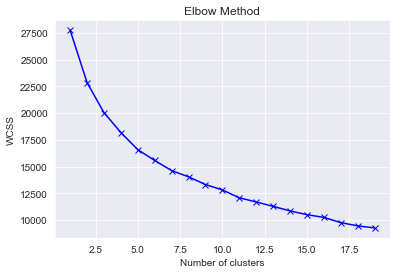

In [254]:
wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_norm)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 20), wcss, 'bx-')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

Text(0.5, 0, 'K')

Text(0, 0.5, 'Silhouette score')

Text(0.5, 1.0, 'Silhouette method')

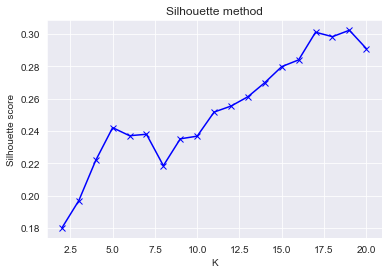

In [255]:
sil = []
kmax = 20

# Dissimilarity can only be measured in more than 1 partition, therefore it starts on K=2
for k in range(2, kmax+1):
  km = KMeans(n_clusters = k, random_state=0).fit(df_norm)
  labels = km.labels_
  sil.append(silhouette_score(df_norm, labels, metric = 'euclidean'))


# Plot results
plt.plot(range(2, kmax+1), sil, 'bx-')
plt.xlabel('K')
plt.ylabel('Silhouette score')
plt.title('Silhouette method')
plt.show()

How to identify the optimal number of Clusters

https://www.datanovia.com/en/lessons/determining-the-optimal-number-of-clusters-3-must-know-methods/

In [257]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(df_norm)

In [258]:
# Count observations per cluster
df_clean.groupby(pred_y).size()

0    2495
1    1942
2    3167
3    2495
dtype: int64

In [259]:
df_clean['Cluster_KMean'] = kmeans.labels_

df_clean.head()

,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,YearsOfCustomer,...,EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',MonthSalBins_<1100,MonthSalBins_1100 - 1500,MonthSalBins_1500 - 1900,MonthSalBins_1900 - 2300,MonthSalBins_2300 - 3200,MonthSalBins_>=5000,Cluster_KMean
CustID,,,,,,,,,,,,,,,,,,,,,
1.00000,1.00000,1.00000,380.97000,0.39000,375.85000,79.45000,146.36000,47.01000,16.89000,31.00000,...,1,0,0,0,0,0,1,0,0,0
2.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000,35.00000,...,1,0,0,1,0,0,0,0,0,1
3.00000,3.00000,0.00000,504.67000,0.28000,206.15000,224.50000,124.58000,86.35000,99.02000,25.00000,...,0,0,0,0,0,0,1,0,0,0
4.00000,4.00000,1.00000,-16.99000,0.99000,182.48000,43.35000,311.17000,35.34000,28.34000,26.00000,...,0,1,0,1,0,0,0,0,0,0
5.00000,4.00000,1.00000,35.23000,0.90000,338.62000,47.80000,182.59000,18.78000,41.45000,30.00000,...,0,1,0,0,0,1,0,0,0,0


In [260]:
# Check the mean values of each cluster for top 30 relevant featureslen()
top_features = df_clean.columns
clustersMeanDF = pd.DataFrame(df_clean[top_features].groupby(pred_y).mean(),columns=top_features)
clustersMeanDF.transpose()

,0,1,2,3
GeoLivArea,2.70220,2.70237,2.69940,2.74870
Children,0.93988,0.80947,0.83707,0.22725
CustMonVal,195.70356,268.13955,217.98439,197.69250
ClaimsRate,0.68779,0.69599,0.66035,0.70703
PremMotor,337.11756,152.44175,376.18248,272.61489
PremHousehold,142.65028,413.38460,140.83685,199.77409
PremHealth,164.53555,190.69186,132.54288,199.50206
PremLife,29.71761,82.54287,28.21913,40.15561
PremWork,29.52592,81.41276,27.53859,38.30769
YearsOfCustomer,30.17996,29.96292,30.11525,29.65451


<h3>Duvidas:</h3>

- Clientes mais novos que suas apólices;

- Clientes mais novos que 16 anos;

- Fazer o ffill nos NaN em Children;

- Dar nomes aos clusters

- Criar visualização dos cluesters
